<h1 align="center"> Deep Multi-task Learning </h1>

---
---


## Problem Overview



Facial key point prediction: In this problem, we predict the keypoints of facial features. 

<br/>

Simply put, Facial keypoint prediction machine takes the image of face as input and predict the co-ordinates of keypoints.

<br/>

This project is the implementation of main ideas of this paper titled [**Facial Landmark Detection by
Deep Multi-task Learning**](http://personal.ie.cuhk.edu.hk/~ccloy/files/eccv_2014_deepfacealign.pdf)

<br/>


![img](https://i.imgur.com/1oKbqBu.png)


## Data Overview

<br/>

- The dataset that we're going to use is being provided by the authors of this paper.

- The dataset comes with 12,995 face images in total, out of which 10k are training images and 2995 are test images.

- The dataset also comes with 4 other facial attributes.

- Out of 10k training images, 4151 images have the shape of (250,250,3), 3499 images have the shape of (400,400,3), and 2350 images have the shape of (216,160,3)

### Reasons

We've chosen this dataset because it comes with several core computer vision challenges like:

- Occulusion : Some part of faces are hidden by some other objects.
- Rotation of image
- Pose variation of faces: Don't contain only frontal images
- Variation of images
- Mulitple faces: there are images with mutliple faces 

[**Source.**](http://personal.ie.cuhk.edu.hk/~ccloy/files/eccv_2014_deepfacealign.pdf)

### Mapping to DL Probelm

- This is a regression problem, as we will predict the continuous values i.e. co-ordinates of facial keypoints.

- This problem comes under the umbrella of computer vision.

### Metrics:

- Mean Squared Error


# Literature overview

Tremendous work had been done in this space by various researchers.  Most of the work around this problem poses it as a single task problem in which they try to solely solve this problem only. But [**this research paper**](http://personal.ie.cuhk.edu.hk/~ccloy/files/eccv_2014_deepfacealign.pdf) comes up with an interesting idea, that is, they've posed it as a deep mutli-task problem. 

**What is a mutli-task problem?**

Multi-task problem: Instead of only one main problem, let's solve related multiple problems together.

Ex: Instead of solving only facial landmark detection problem, let's also solve related auxiliary problems like: whether the person in the image is similng or not, what's the gender of the person, etc..


#### There are 5 tasks to be learned:

---

- Each image is asscociated with 5 main facial key points. **[Facial Keypoint prediction] - Regression Task**

---
- Each image is also associated with male/female label. **[Male/Female] - Binary Classification**

---
- Each image is also associated with smile/no-smile label. **[Smile/no-smile] - Binary Classification**

---

- Each image is also associated with whether person has specs/no-specs label. **[Glasses/no-glasses] - Binary Classification**

---
- Each image is also associated with Pose-estimation label. **[-60|-30|0|30|60] - Multi-Class Classification**

---


![multi-task](https://wiki.tum.de/download/attachments/23564055/image2017-1-17%2016%3A47%3A0.png?version=1&modificationDate=1484668020520&api=v2)

In [1]:
# Importing libraries
import os
import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import numpy as np
import pandas as pd
from tqdm import tqdm
tqdm.pandas()

from datetime import datetime

from sklearn.preprocessing import LabelBinarizer, OneHotEncoder

from tensorflow.keras.layers import Conv2D, Flatten, LSTM, Input , Dense, Activation, MaxPooling2D, BatchNormalization, Dropout
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import TensorBoard

from time import time

%load_ext tensorboard

from sklearn.metrics import mean_squared_error

import pickle

import os
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.python.eager import context
tf.enable_eager_execution()

##  Data Overview

In [2]:
# there are three directories present in the dataset
image_dirs = ['AFLW','net_7876','lfw_5590']

for im_dir in image_dirs:
    print('Number of images in {}: {}'.format(im_dir,len(os.listdir(im_dir))))

Number of images in AFLW: 2995
Number of images in net_7876: 7876
Number of images in lfw_5590: 5590


In [3]:
# reading the training csv file
train = pd.read_csv('training_new.txt',sep=' ',header=None,names=['Path']+list('BCDEFGHIJK')+['Gender','Smile','Glasses','Pose'])
print(train.shape)
train['Path'] = train['Path'].str.replace('\\','/')
train.head()

(10000, 15)


,Path,B,C,D,E,F,G,H,I,J,K,Gender,Smile,Glasses,Pose
0,lfw_5590/Aaron_Eckhart_0001.jpg,107.25,147.75,126.25,106.25,140.75,108.75,113.25,143.75,158.75,162.75,1,2,2,3
1,lfw_5590/Aaron_Guiel_0001.jpg,101.25,146.75,125.25,93.75,139.75,112.25,117.75,137.75,160.75,164.75,1,1,2,3
2,lfw_5590/Aaron_Peirsol_0001.jpg,107.75,147.75,130.25,109.25,147.75,114.25,114.25,140.75,154.25,153.75,1,1,2,3
3,lfw_5590/Aaron_Pena_0001.jpg,102.75,146.25,126.25,120.75,147.25,117.75,104.75,137.75,164.75,156.75,1,2,2,3
4,lfw_5590/Aaron_Sorkin_0001.jpg,102.25,144.75,130.75,100.25,143.25,113.25,112.75,138.75,156.25,155.75,1,1,2,3


---
> Path: the path of the image(absolute path)
---

> BCDEF: these are x co-ordinates of keypoints
---
> GHIJK: these are the y co-ordinates of keypoints
---
> Gender: whether the person is male/female, 1: Male, 2: Female
---
> Smile: Whether the person is smiling or not, 1: Smile, 2:Not smile
---
> Glasses: whether the person has glasses or not, 1: Glasses, 2: No Glasses
---
> Pose: [Pose estimation ] , [In degree] [-60] (1) / [-30] (2) / [0] (3)/ [30] (4)/ [60] (5) 
---
---


<br/>
(B,G):(2,7) - (x,y) right eye centre
<br/>
(C,H):(3,8) - (x,y) left eye centre
<br/>
(D,I):(4,9) - (x,y) nose centre
<br/>
(E,J):(5,10)- (x,y) extreme right point of mouth
<br/>
(F,K):(6,11)- (x,y) extreme left point of mouth

<br/>

## Visualizing the dataset

(400, 400, 3)


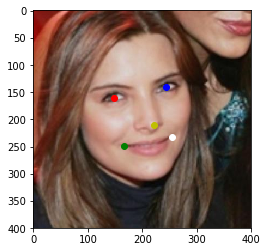

In [4]:
# visualizing a random image with keypoints
n = np.random.randint(low=2,high=5000)
row = train.iloc[n]
img =  cv2.imread(row['Path'])
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
print(img.shape)
plt.scatter(row['B'],row['G'],c='r')
plt.scatter(row['C'],row['H'],c='b')
plt.scatter(row['D'],row['I'],c='y')
plt.scatter(row['E'],row['J'],c='g')
plt.scatter(row['F'],row['K'],c='w')
plt.imshow(img)
plt.show()

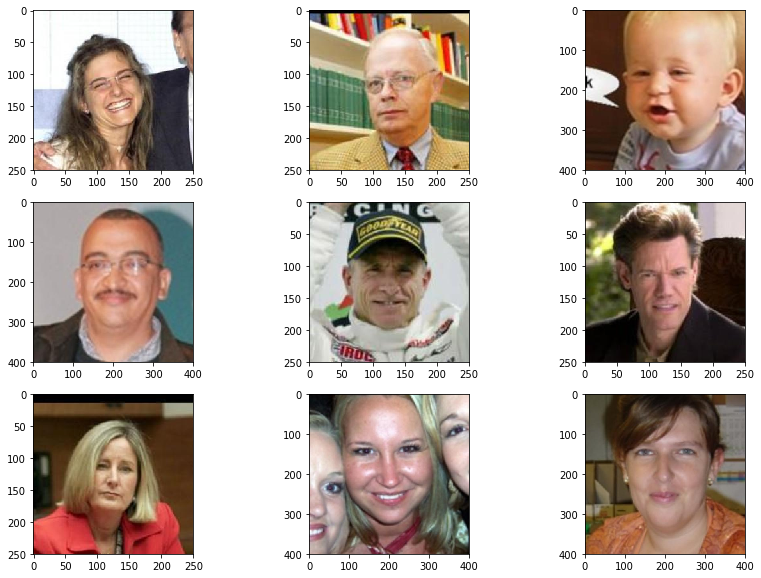

In [5]:
#visualising the dataset
images = []
random_ints = np.random.randint(low=1,high=8000,size=(9,))
for i in random_ints:
    img = cv2.imread(train['Path'].iloc[i])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    images.append(img)

fig,axs = plt.subplots(nrows=3,ncols=3,figsize=(14,10))

k =0
for i in range(0,3):
    for j in range(0,3):
        axs[i,j].imshow(images[k])
        k += 1

plt.show()

## Modelling the data  for deep network

> Images are of different shapes, out of 10k training images, 4151 images have the shape of (250,250,3), 3499 images have the shape of (400,400,3), and 2350 images have the shape of (216,160,3)

---

> Resizing all of them to (160,160,3) for constant input and then changing keypoint positions accordingly

In [6]:
#utility function to load and resize all of the images uniformly for network input
def image(im_path):
    '''
    
    This function takes the path of original image as input, read the image,
    convert the color schema from BGR to RGB and then resize it to (160,160,3).
    
    Parameter: Path of image
    Return: Image with shape (160,160,3)
    
    '''
    img =  cv2.imread(im_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (160,160), cv2.INTER_AREA) #(w,h) #(#cols,#rows)
    return img

In [7]:
#utility function to calculate the newly w_h ratio after resizing the image so that keypoints can be transformed accordingly
def w_h_ratio(im_path):
    '''
    This function takes the path of original image as input, calculate the original dims of image
    and then calculates the width and heigh ratio by dividing new dim by original dim.
    
    Parameter: Image path
    Returns: Ratio of new width/height to original one
    
    '''
    img =  cv2.imread(im_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    (h, w) = img.shape[:2]
    r_w = 160 / float(w)
    r_h = 160/ (float(h))
    return [r_w,r_h]

In [8]:
# calculating the ratio of new_shape/old_shape
train[['r_w','r_h']] = train.apply(lambda x: w_h_ratio(x['Path']),axis=1,result_type='expand')

In [9]:
# changing the (x,y) co-ordinates with new ones after resizing
for x in list('BCDEF'):
    train[x] = train[x]*train['r_w'] #x_co-ordinate
for y in list('GHIJK'):
    train[y] = train[y]*train['r_h'] #y_co-ordinate
    
train.drop(['r_w','r_h'],axis=1,inplace=True)

(160, 160, 3)


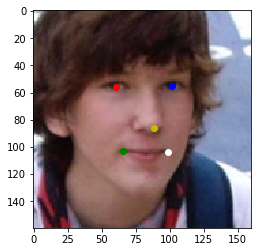

In [10]:
#visualizing the image with keypoints after resizing
n = np.random.randint(low=1,high=6000)
row = train.iloc[n]
img =  image(row['Path'])
print(img.shape)
plt.scatter(row['B'],row['G'],c='r')
plt.scatter(row['C'],row['H'],c='b')
plt.scatter(row['D'],row['I'],c='y')
plt.scatter(row['E'],row['J'],c='g')
plt.scatter(row['F'],row['K'],c='w')
plt.imshow(img)
plt.show()

In [11]:
# loading, resizing and then storing all of the images in a numpy array
images = []

for row in tqdm(train.iterrows()):
    img = image(row[1]['Path'])
    images.append(img)
    
images = np.array(images)
print(images.shape)

10000it [00:18, 530.59it/s]


(10000, 160, 160, 3)


In [12]:
#utitlity function to visualize the performance on train data of model
def viz_result_train(train_pred,result):
    
    '''
    Used to visualize the train predictions.
    
    Parameter: Training prediction list/array
    Returns: None
    
    Does: 
    1.Plot the training images.
    2.Plot the training keypoint predictions
    3. Print the output of categorical variables:
        a) Smile/Not smile
        b) Male/Female
        c) Glasses/No Glasses
        d) Pose variation
    
    '''
    
    random_ints = np.random.randint(low=1,high=8999,size=(4,))
    
    fig,axs = plt.subplots(nrows=1,ncols=4,figsize=(13,4))
    k = 0
    sig = 0 
    for i in range(0,4):
        axs[i].imshow(train_images[random_ints[i]])
        if result[0]:
            reg_result = list(train_pred[k][random_ints[i]])

            sig = 1
            axs[i].scatter(reg_result[0:5],reg_result[5:])
    plt.show() 
    
    if sig:
        k += 1
    
    if result[1]:
        res = train_pred[k][random_ints[0]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[1]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[2]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[3]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res)
        
        k +=1
    if result[2]:
        res = train_pred[k][random_ints[0]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[1]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[2]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[3]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[3]:
        res = train_pred[k][random_ints[0]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[1]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[2]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = train_pred[k][random_ints[3]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[4]:
        res = train_pred[k][random_ints[0]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*8,end='')
        print('Pose: {}'.format(res),end='')
        
        res = train_pred[k][random_ints[1]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = train_pred[k][random_ints[2]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = train_pred[k][random_ints[3]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='\n')
        
        k +=1

In [13]:
def viz_result_val(val_pred,result):
    
    
    '''
    
    Used to visualize the validation predictions.
    
    Parameter: validation prediction list/array
    Returns: None
    
    Does: 
    1.Plot the validation images.
    2.Plot the validation keypoint predictions
    3. Print the output of categorical variables:
        a) Smile/Not smile
        b) Male/Female
        c) Glasses/No Glasses
        d) Pose variation
    
    '''
    
    
    random_ints = np.random.randint(low=1,high=999,size=(4,))
    
    fig,axs = plt.subplots(nrows=1,ncols=4,figsize=(13,4))
    k = 0
    sig = 0 
    for i in range(0,4):
        axs[i].imshow(val_images[random_ints[i]])
        if result[0]:
            reg_result = list(val_pred[k][random_ints[i]])

            sig = 1
            axs[i].scatter(reg_result[0:5],reg_result[5:])
    plt.show() 
    
    if sig:
        k += 1
    
    if result[1]:
        res = val_pred[k][random_ints[0]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[1]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[2]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[3]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res)
        
        k +=1
    if result[2]:
        res = val_pred[k][random_ints[0]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[1]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[2]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[3]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[3]:
        res = val_pred[k][random_ints[0]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[1]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[2]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = val_pred[k][random_ints[3]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[4]:
        res = val_pred[k][random_ints[0]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*8,end='')
        print('Pose: {}'.format(res),end='')
        
        
        res = val_pred[k][random_ints[1]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = val_pred[k][random_ints[2]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = val_pred[k][random_ints[3]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='\n')
        
        k +=1

In [14]:
def viz_result_test(test_pred, result):
    
    
    '''
    Used to visualize the test predictions.
    
    Parameter: Test prediction list/array
    Returns: None
    
    Does: 
    1.Plot the test images.
    2.Plot the test keypoint predictions
    3. Print the output of categorical variables:
        a) Smile/Not smile
        b) Male/Female
        c) Glasses/No Glasses
        d) Pose variation
    
    '''
    
    random_ints = np.random.randint(low=1,high=999,size=(4,))
    
    fig,axs = plt.subplots(nrows=1,ncols=4,figsize=(13,4))
    k = 0
    sig = 0 
    for i in range(0,4):
        axs[i].imshow(test_images[random_ints[i]])
        if result[0]:
            reg_result = list(test_pred[k][random_ints[i]])

            sig = 1
            axs[i].scatter(reg_result[0:5],reg_result[5:])
    plt.show() 
    
    if sig==1:
        k += 1
    
    if result[1]:
        res = test_pred[k][random_ints[0]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[1]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[2]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[3]]
        res = ohes[0].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = gender_map[res]
        print(' '*21,end='')
        print(res)
        
        k +=1
    if result[2]:
        res = test_pred[k][random_ints[0]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[1]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[2]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[3]]
        res = ohes[1].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = smile_map[res]
        if res=='Smile':
            print(' '*20,end='')
        else:
            print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[3]:
        res = test_pred[k][random_ints[0]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*8,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[1]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[2]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='')
        
        res = test_pred[k][random_ints[3]]
        res = ohes[2].inverse_transform(res.reshape(-1, 2))
        res = res[0][0]
        res = glasses_map[res]
        print(' '*15,end='')
        print(res,end='\n')
        
        k +=1
    if result[4]:
        res = test_pred[k][random_ints[0]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*8,end='')
        print('Pose: {}'.format(res),end='')
        
        
        res = test_pred[k][random_ints[1]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = test_pred[k][random_ints[2]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='')
        
        res = test_pred[k][random_ints[3]]
        res = ohes[3].inverse_transform(res.reshape(-1, 5))
        res = res[0][0]
        res = pose_map[res]
        print(' '*17,end='')
        print('Pose: {}'.format(res),end='\n')
        
        k +=1

## Train-Validation split

In [15]:
train_images = images[:9000]
val_images = images[9000:]
keypoint_op = train[list('BCDEFGHIJK')].values
train_keypoint_op = keypoint_op[:9000]
val_keypoint_op = keypoint_op[9000:]


In [16]:
ohes = []
categorical_cols = ['Gender','Smile','Glasses','Pose']

train_categorical_ops = []
val_categorical_ops = []

shapes = []

for name in categorical_cols:
    ohe = OneHotEncoder()
    train_categorical_op = ohe.fit_transform(train[name].iloc[:9000].values.reshape(-1, 1) )
    val_categorical_op = ohe.transform(train[name].iloc[9000:].values.reshape(-1, 1))

    
    train_categorical_ops.append(train_categorical_op)
    val_categorical_ops.append(val_categorical_op)
    
    ohes.append(ohe)
    
    shapes.append(train_categorical_op.shape[1])
    print('[INFO] Done For {} with shape: {} '.format(name,train_categorical_op.shape[1]))

[INFO] Done For Gender with shape: 2 
[INFO] Done For Smile with shape: 2 
[INFO] Done For Glasses with shape: 2 
[INFO] Done For Pose with shape: 5 


In [17]:
pickle.dump(ohes,open('ohes.pkl','wb'))
#ohes = pickle.load(open('ohes.pkl','rb'))

In [17]:
gender_map = {1:'Male',2:'Female'}
smile_map = {1:'Smile',2:'Not Smile'}
glasses_map = {1:'With Glasses',2:'No Glasses'}
pose_map = {1: '-60',2:'-30',3:'0',4:'+30',5:'+60'}

In [18]:
#there are tons of metrics and losses to plot for Tensorboard callback, that's why plotting training and validation
#metrics and loss on same graph.

#It will also help to compare both.

#credit: https://stackoverflow.com/questions/47877475/keras-tensorboard-plot-train-and-validation-scalars-in-a-same-figure

class TrainValTensorBoard(TensorBoard):
    def __init__(self, log_dir='./logs', **kwargs):
        
        '''
        Creates the directories.
        '''
        
        self.val_log_dir = os.path.join(log_dir, 'validation')
        training_log_dir = os.path.join(log_dir, 'training')
        super(TrainValTensorBoard, self).__init__(training_log_dir, **kwargs)

    def set_model(self, model):
        
        '''
        Set the model and create the writer for validation.
        '''
        
        if context.executing_eagerly():
            self.val_writer = tf.contrib.summary.create_file_writer(self.val_log_dir)
        else:
            self.val_writer = tf.summary.FileWriter(self.val_log_dir)
        super(TrainValTensorBoard, self).set_model(model)

    def _write_custom_summaries(self, step, logs=None):
        
        '''
        Write the metrics/loss to the above created writers
        '''
        
        logs = logs or {}
        val_logs = {k.replace('val_', ''): v for k, v in logs.items() if 'val_' in k}
        if context.executing_eagerly():
            with self.val_writer.as_default(), tf.contrib.summary.always_record_summaries():
                for name, value in val_logs.items():
                    tf.contrib.summary.scalar(name, value.item(), step=step)
        else:
            for name, value in val_logs.items():
                summary = tf.Summary()
                summary_value = summary.value.add()
                summary_value.simple_value = value.item()
                summary_value.tag = name
                self.val_writer.add_summary(summary, step)
        self.val_writer.flush()

        logs = {k: v for k, v in logs.items() if not 'val_' in k}
        super(TrainValTensorBoard, self)._write_custom_summaries(step, logs)

    def on_train_end(self, logs=None):
        
        '''
        Call after the end of training process.
        '''
        super(TrainValTensorBoard, self).on_train_end(logs)
        self.val_writer.close()


---
---

This is the deep multi-task problem in which we force the network to learn multiple tasks simulatenously.

<br/>

Out of multiple tasks, the main task is **Key point detection.**

<br/>

The other auxiliary tasks are: **Smile detection, Glasses detection, Gender Detection, and Pose estimation**

<br/>

> Throughout all of the literature regarding **KeyPoint detection**, all of the work had been done by treating the keypoint problem as a single task, but the nature of problem signifies that this task is also dependent on other auxiliary task.

<br/>

**How?**

- Mouth keypoints position is highly dependent on whether the person is smiling or not.

- And above this, the positions of all facial keypoints is way more dependent on the pose of face in the image.


<br/>

So, it's been concluded that this main task when solved with other auxiliary tasks can be solved efficiently. and hence, it's a **Multi-Task Problem.**

<br/>

And that's the exact approach this [paper](http://personal.ie.cuhk.edu.hk/~ccloy/files/eccv_2014_deepfacealign.pdf) deals with.

## Mathematical details

As now, we're solving multiple tasks together, we've to create the network such that it gives multiple outputs, optimize for multiple loss functions together.

<br/>

In keras, this can be done only by **Functional API** , the objective loss function is the total weighted sum of different individual losses.

<br/>



---
---
---

> **Our approach: Run the main task with other auxiliary task with different settings and see which one works out.**

---
---
---

# Model - all tasks with intuitive weights

In [41]:
inp = Input(shape=(160,160,3))

#1st convolution pair
conv1 = Conv2D(16,kernel_size=(5,5), activation='relu')(inp)
mx1 = MaxPooling2D(pool_size=(2,2))(conv1)


#2nd convolution pair
conv2 = Conv2D(48,kernel_size=(3,3), activation='relu')(mx1)
mx2 = MaxPooling2D(pool_size=(2,2))(conv2)


#3rd convolution pair
conv3 = Conv2D(64,kernel_size=(3,3), activation='relu')(mx2)
mx3 = MaxPooling2D(pool_size=(2,2))(conv3)


#4th convolution pair
conv4 = Conv2D(64,kernel_size=(2,2), activation='relu')(mx3)

flt = Flatten()(conv4)

dense = Dense(100,activation='relu')(flt)

reg_op = Dense(10,activation='linear',name='key_point')(dense)

gndr_op = Dense(2,activation='sigmoid',name='gender')(dense)

smile_op = Dense(2,activation='sigmoid',name='smile')(dense)

glasses_op = Dense(2,activation='sigmoid',name='glasses')(dense)

pose_op = Dense(5,activation='softmax',name='pose')(dense)

model = Model(inp,[reg_op,gndr_op,smile_op,glasses_op,pose_op])

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 156, 156, 16) 1216        input_4[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_9 (MaxPooling2D)  (None, 78, 78, 16)   0           conv2d_12[0][0]                  
__________________________________________________________________________________________________
conv2d_13 (Conv2D)              (None, 76, 76, 48)   6960        max_pooling2d_9[0][0]            
____________________________________________________________________________________________

In [42]:
# These losses will be added in keras at the time of optimization
# reference : https://www.amazon.com/Deep-Learning-Python-Francois-Chollet/dp/1617294438

loss_dic = {'key_point':'mse','gender':'binary_crossentropy','smile':'binary_crossentropy', 'glasses':'binary_crossentropy' , 'pose':'categorical_crossentropy'}

# sicnce the main task is keypoint detection, hence giving more weightage to this one.
# other important task in pose estimation

loss_weights = {'key_point':7,'gender':2,'smile':4,'glasses':1,'pose':3}

metrics = {'key_point':'mse','gender':['binary_crossentropy','acc'],'smile':['binary_crossentropy','acc'], 'glasses':['binary_crossentropy','acc'] , 'pose':['categorical_crossentropy','acc']}

In [43]:
model.compile(optimizer='adam',loss=loss_dic,loss_weights=loss_weights,metrics=metrics)

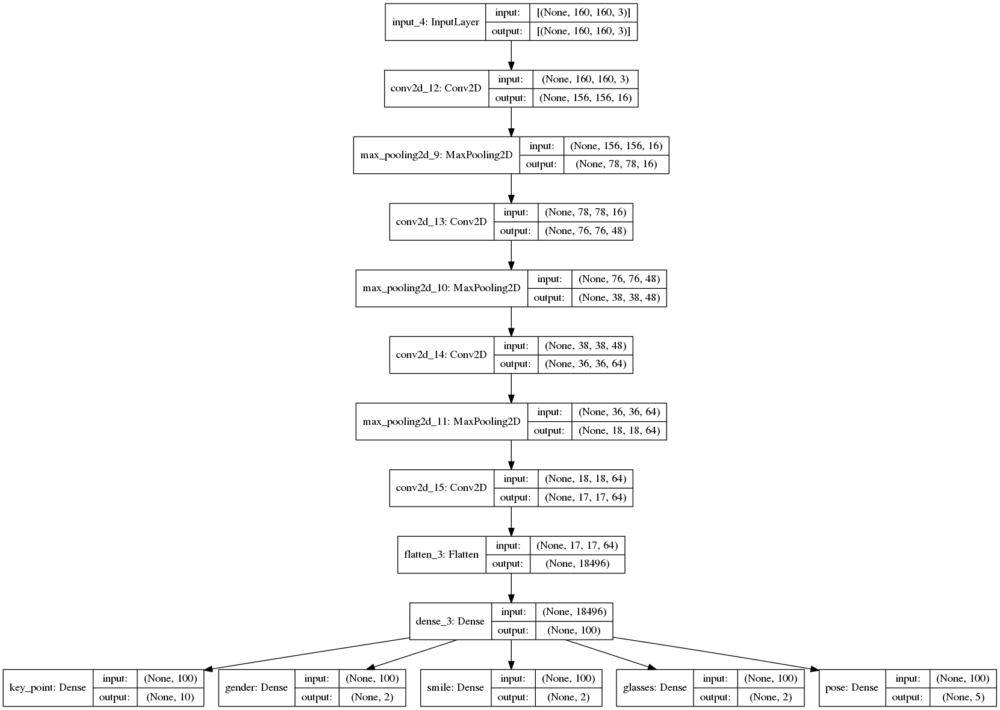

In [44]:
plot_model(model,to_file='model1.png',show_shapes=True)

In [45]:

epochs = 35
bs = 64

In [46]:
start = datetime.now()

H = model.fit(train_images, [train_keypoint_op,]+train_categorical_ops, epochs = epochs, batch_size=bs, validation_data=(val_images,[val_keypoint_op,]+val_categorical_ops),callbacks=[TrainValTensorBoard(log_dir='./log1',write_graph=False)])

Train on 9000 samples, validate on 1000 samples
Epoch 1/35
9000/9000 [==============================] - 116s 13ms/sample - loss: 2914.6465 - key_point_loss: 407.2976 - gender_loss: 4.5145 - smile_loss: 2.6902 - glasses_loss: 1.8983 - pose_loss: 12.9396 - key_point_mean_squared_error: 407.7194 - gender_binary_crossentropy: 4.5222 - gender_acc: 0.4951 - smile_binary_crossentropy: 2.6941 - smile_acc: 0.5091 - glasses_binary_crossentropy: 1.9000 - glasses_acc: 0.7314 - pose_categorical_crossentropy: 12.9633 - pose_acc: 0.1891 - val_loss: 2019.8852 - val_key_point_loss: 281.6278 - val_gender_loss: 2.1029 - val_smile_loss: 2.3326 - val_glasses_loss: 0.7049 - val_pose_loss: 11.2701 - val_key_point_mean_squared_error: 281.6933 - val_gender_binary_crossentropy: 2.1186 - val_gender_acc: 0.5335 - val_smile_binary_crossentropy: 2.3320 - val_smile_acc: 0.4900 - val_glasses_binary_crossentropy: 0.7153 - val_glasses_acc: 0.8645 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch

Epoch 10/35
9000/9000 [==============================] - 115s 13ms/sample - loss: 144.1259 - key_point_loss: 18.6035 - gender_loss: 0.5671 - smile_loss: 0.5920 - glasses_loss: 0.4505 - pose_loss: 3.3222 - key_point_mean_squared_error: 18.5994 - gender_binary_crossentropy: 0.5674 - gender_acc: 0.6959 - smile_binary_crossentropy: 0.5921 - smile_acc: 0.6820 - glasses_binary_crossentropy: 0.4503 - glasses_acc: 0.8390 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 338.2577 - val_key_point_loss: 42.7001 - val_gender_loss: 0.7975 - val_smile_loss: 0.8486 - val_glasses_loss: 0.4721 - val_pose_loss: 11.2229 - val_key_point_mean_squared_error: 42.7196 - val_gender_binary_crossentropy: 0.7989 - val_gender_acc: 0.5445 - val_smile_binary_crossentropy: 0.8498 - val_smile_acc: 0.5230 - val_glasses_binary_crossentropy: 0.4723 - val_glasses_acc: 0.8930 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 11/35
9000/9000 [==============================] - 115

Epoch 19/35
9000/9000 [==============================] - 115s 13ms/sample - loss: 55.3460 - key_point_loss: 6.0528 - gender_loss: 0.4592 - smile_loss: 0.4259 - glasses_loss: 0.3935 - pose_loss: 3.3254 - key_point_mean_squared_error: 6.0504 - gender_binary_crossentropy: 0.4593 - gender_acc: 0.7826 - smile_binary_crossentropy: 0.4260 - smile_acc: 0.8028 - glasses_binary_crossentropy: 0.3936 - glasses_acc: 0.8536 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 243.3782 - val_key_point_loss: 29.0843 - val_gender_loss: 0.7973 - val_smile_loss: 0.9033 - val_glasses_loss: 0.3675 - val_pose_loss: 11.2606 - val_key_point_mean_squared_error: 29.1496 - val_gender_binary_crossentropy: 0.7961 - val_gender_acc: 0.5670 - val_smile_binary_crossentropy: 0.9061 - val_smile_acc: 0.5695 - val_glasses_binary_crossentropy: 0.3630 - val_glasses_acc: 0.8875 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 20/35
9000/9000 [==============================] - 115s 1

Epoch 28/35
9000/9000 [==============================] - 116s 13ms/sample - loss: 36.2739 - key_point_loss: 3.4296 - gender_loss: 0.3670 - smile_loss: 0.3115 - glasses_loss: 0.3074 - pose_loss: 3.3286 - key_point_mean_squared_error: 3.4299 - gender_binary_crossentropy: 0.3670 - gender_acc: 0.8418 - smile_binary_crossentropy: 0.3115 - smile_acc: 0.8674 - glasses_binary_crossentropy: 0.3073 - glasses_acc: 0.8800 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 261.9627 - val_key_point_loss: 31.8246 - val_gender_loss: 0.6865 - val_smile_loss: 0.8864 - val_glasses_loss: 0.3470 - val_pose_loss: 11.2323 - val_key_point_mean_squared_error: 31.8460 - val_gender_binary_crossentropy: 0.6879 - val_gender_acc: 0.6300 - val_smile_binary_crossentropy: 0.8925 - val_smile_acc: 0.5860 - val_glasses_binary_crossentropy: 0.3439 - val_glasses_acc: 0.8885 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 29/35
9000/9000 [==============================] - 115s 1

In [47]:
end = datetime.now()

print('\n\nTime taken to train the model: ',end-start)
model.save('all_lossses_weighst1.h5')

train_pred = model.predict(train_images)
val_pred = model.predict(val_images)

print('MSE on train data: ', mean_squared_error(train_keypoint_op,train_pred[0] ))
print('MSE on validation data: ', mean_squared_error(val_keypoint_op,val_pred[0] ))



Time taken to train the model:  1:07:01.243310
MSE on train data:  2.0609966325423565
MSE on validation data:  29.55315040683187


### Train Performance Visualization

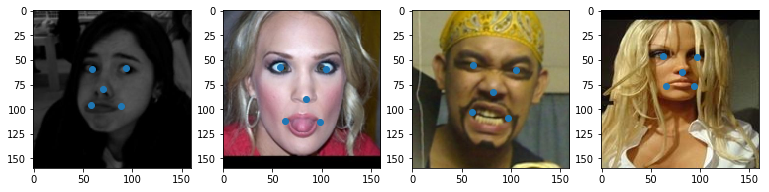

        Female                     Female                     Male                     Female
        Not Smile               Not Smile               Not Smile               Not Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


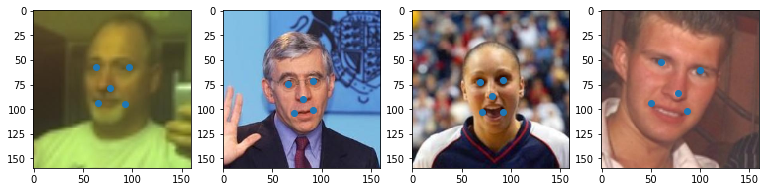

        Male                     Male                     Male                     Male
        Not Smile               Not Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


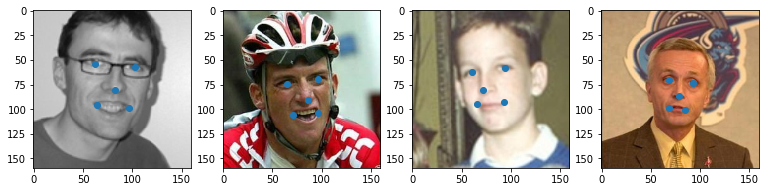

        Male                     Male                     Female                     Male
        Smile               Not Smile                    Smile               Not Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [48]:
viz_result_train(train_pred , [1,1,1,1,1])
viz_result_train(train_pred , [1,1,1,1,1])
viz_result_train(train_pred , [1,1,1,1,1])

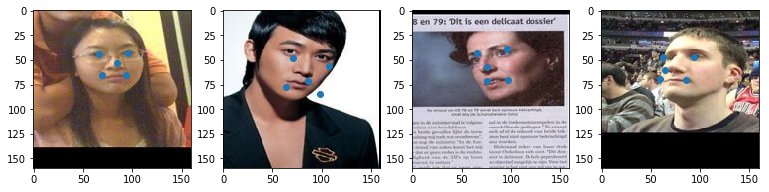

        Female                     Male                     Female                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


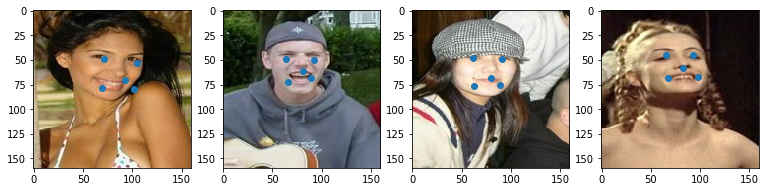

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


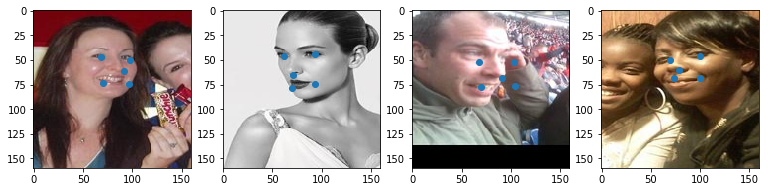

        Male                     Female                     Male                     Female
        Smile               Not Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [54]:
viz_result_val(val_pred,[1,1,1,1,1])
viz_result_val(val_pred,[1,1,1,1,1])
viz_result_val(val_pred,[1,1,1,1,1])

# Losses and Metric Visualization

![img](https://i.imgur.com/FQ7Yz0d.png)
![img](https://i.imgur.com/QUCGBlq.png)
![img](https://i.imgur.com/VEuDTVJ.png)
![img](https://i.imgur.com/rDUlANe.png)
![img](https://i.imgur.com/wxDcyrl.png)
![img](https://i.imgur.com/1NL9nBg.png)
![img](https://i.imgur.com/OcvEFCO.png)
![img](https://i.imgur.com/ZxGYqns.png)
![img](https://i.imgur.com/ko20eVs.png)
![img](https://i.imgur.com/UDroVAw.png)

---
---
---
---
---
---

> One thing to be noted: there is big difference in the unit of MSE loss and logloss. So, as observed from above experiments, it's wise to give more weightage to pose estimation loss and lower to keypoint loss..


---

## 2nd one: Model with observational loss weights

In [39]:
inp = Input(shape=(160,160,3))

#1st convolution pair
conv1 = Conv2D(16,kernel_size=(5,5), activation='relu')(inp)
mx1 = MaxPooling2D(pool_size=(2,2))(conv1)

#2nd convolution pair
conv2 = Conv2D(48,kernel_size=(3,3), activation='relu')(mx1)
mx2 = MaxPooling2D(pool_size=(2,2))(conv2)


#3rd convolution pair
conv3 = Conv2D(64,kernel_size=(3,3), activation='relu')(mx2)
mx3 = MaxPooling2D(pool_size=(2,2))(conv3)


#4th convolution pair
conv4 = Conv2D(64,kernel_size=(2,2), activation='relu')(mx3)

flt = Flatten()(conv4)

dense = Dense(100,activation='relu')(flt)

reg_op = Dense(10,activation='linear',name='key_point')(dense)

gndr_op = Dense(2,activation='sigmoid',name='gender')(dense)

smile_op = Dense(2,activation='sigmoid',name='smile')(dense)

glasses_op = Dense(2,activation='sigmoid',name='glasses')(dense)

pose_op = Dense(5,activation='softmax',name='pose')(dense)

model = Model(inp,[reg_op,gndr_op,smile_op,glasses_op,pose_op])

model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 156, 156, 16) 1216        input_3[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 78, 78, 16)   0           conv2d_8[0][0]                   
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 76, 76, 48)   6960        max_pooling2d_6[0][0]            
____________________________________________________________________________________________

In [40]:
# These losses will be added in keras at the time of optimization
# reference : https://www.amazon.com/Deep-Learning-Python-Francois-Chollet/dp/1617294438

loss_dic = {'key_point':'mse','gender':'binary_crossentropy','smile':'binary_crossentropy', 'glasses':'binary_crossentropy' , 'pose':'categorical_crossentropy'}

# more weight to pose estimation


loss_weights = {'key_point':2,'gender':1,'smile':4,'glasses':1,'pose':11}

metrics = {'key_point':'mse','gender':['binary_crossentropy','acc'],'smile':['binary_crossentropy','acc'], 'glasses':['binary_crossentropy','acc'] , 'pose':['categorical_crossentropy','acc']}

In [41]:
model.compile(optimizer='adam',loss=loss_dic,loss_weights=loss_weights,metrics=metrics)

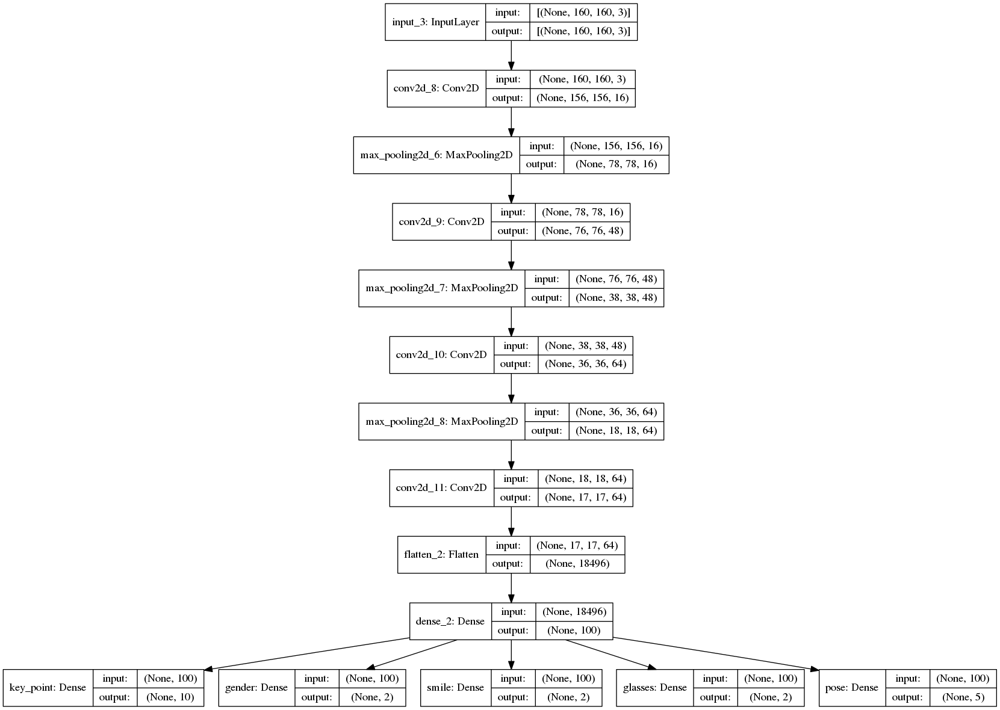

In [42]:
plot_model(model,to_file='model2.png',show_shapes=True)

In [43]:
epochs = 35
bs = 64
tsboard = TensorBoard(log_dir='logs2/{}'.format(time()), write_graph=True, write_images=True)

In [44]:
start = datetime.now()
H = model.fit(train_images, [train_keypoint_op,]+train_categorical_ops, epochs = epochs, batch_size=bs, validation_data=(val_images,[val_keypoint_op,]+val_categorical_ops),callbacks=[TrainValTensorBoard(log_dir='./log2',write_graph=False)])

Train on 9000 samples, validate on 1000 samples
Epoch 1/35
9000/9000 [==============================] - 142s 16ms/sample - loss: 994.9010 - key_point_loss: 460.2114 - gender_loss: 5.6065 - smile_loss: 6.6496 - glasses_loss: 3.8611 - pose_loss: 3.3225 - key_point_mean_squared_error: 461.1576 - gender_binary_crossentropy: 5.6071 - gender_acc: 0.4510 - smile_binary_crossentropy: 6.6427 - smile_acc: 0.5649 - glasses_binary_crossentropy: 3.8692 - glasses_acc: 0.7109 - pose_categorical_crossentropy: 3.3217 - pose_acc: 0.7932 - val_loss: 672.2650 - val_key_point_loss: 256.2110 - val_gender_loss: 3.8211 - val_smile_loss: 7.3439 - val_glasses_loss: 1.3972 - val_pose_loss: 11.2701 - val_key_point_mean_squared_error: 256.8843 - val_gender_binary_crossentropy: 3.8121 - val_gender_acc: 0.5195 - val_smile_binary_crossentropy: 7.3817 - val_smile_acc: 0.5200 - val_glasses_binary_crossentropy: 1.4028 - val_glasses_acc: 0.7815 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 2/3

Epoch 10/35
9000/9000 [==============================] - 140s 16ms/sample - loss: 78.9642 - key_point_loss: 13.1025 - gender_loss: 0.5072 - smile_loss: 3.5928 - glasses_loss: 1.3103 - pose_loss: 3.3254 - key_point_mean_squared_error: 13.0987 - gender_binary_crossentropy: 0.5075 - gender_acc: 0.7491 - smile_binary_crossentropy: 3.5913 - smile_acc: 0.6496 - glasses_binary_crossentropy: 1.3112 - glasses_acc: 0.8553 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 228.0789 - val_key_point_loss: 42.8839 - val_gender_loss: 0.7330 - val_smile_loss: 4.0504 - val_glasses_loss: 1.0107 - val_pose_loss: 11.2323 - val_key_point_mean_squared_error: 43.1823 - val_gender_binary_crossentropy: 0.7340 - val_gender_acc: 0.5795 - val_smile_binary_crossentropy: 4.0560 - val_smile_acc: 0.5405 - val_glasses_binary_crossentropy: 1.0017 - val_glasses_acc: 0.8930 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 11/35
9000/9000 [==============================] - 139s

Epoch 19/35
9000/9000 [==============================] - 140s 16ms/sample - loss: 62.2948 - key_point_loss: 5.0330 - gender_loss: 0.3714 - smile_loss: 3.5025 - glasses_loss: 1.2586 - pose_loss: 3.3244 - key_point_mean_squared_error: 5.0313 - gender_binary_crossentropy: 0.3715 - gender_acc: 0.8364 - smile_binary_crossentropy: 3.5048 - smile_acc: 0.7049 - glasses_binary_crossentropy: 1.2590 - glasses_acc: 0.8715 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 200.7863 - val_key_point_loss: 29.4159 - val_gender_loss: 0.7221 - val_smile_loss: 4.1183 - val_glasses_loss: 0.9949 - val_pose_loss: 11.2417 - val_key_point_mean_squared_error: 29.4703 - val_gender_binary_crossentropy: 0.7220 - val_gender_acc: 0.6210 - val_smile_binary_crossentropy: 4.0959 - val_smile_acc: 0.5500 - val_glasses_binary_crossentropy: 0.9855 - val_glasses_acc: 0.8945 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 20/35
9000/9000 [==============================] - 139s 1

Epoch 28/35
9000/9000 [==============================] - 141s 16ms/sample - loss: 58.6541 - key_point_loss: 3.3957 - gender_loss: 0.2700 - smile_loss: 3.4477 - glasses_loss: 1.2251 - pose_loss: 3.3254 - key_point_mean_squared_error: 3.3932 - gender_binary_crossentropy: 0.2700 - gender_acc: 0.8908 - smile_binary_crossentropy: 3.4472 - smile_acc: 0.7405 - glasses_binary_crossentropy: 1.2260 - glasses_acc: 0.8867 - pose_categorical_crossentropy: 3.3257 - pose_acc: 0.7937 - val_loss: 202.9349 - val_key_point_loss: 30.3931 - val_gender_loss: 0.7382 - val_smile_loss: 4.1567 - val_glasses_loss: 1.0071 - val_pose_loss: 11.2229 - val_key_point_mean_squared_error: 30.4348 - val_gender_binary_crossentropy: 0.7364 - val_gender_acc: 0.6485 - val_smile_binary_crossentropy: 4.1430 - val_smile_acc: 0.5590 - val_glasses_binary_crossentropy: 1.0022 - val_glasses_acc: 0.8950 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 29/35
9000/9000 [==============================] - 140s 1

In [ ]:

%tensorboard --logdir {'logs2/'} --host localhost --port 8083

In [46]:
end = datetime.now()
print('\n\nTime taken to train the model: ',end-start)
model.save('all_lossses_weighst2.h5')
train_pred = model.predict(train_images)
val_pred = model.predict(val_images)

print('MSE on train data: ', mean_squared_error(train_keypoint_op,train_pred[0] ))
print('MSE on validation data: ', mean_squared_error(val_keypoint_op,val_pred[0] ))



Time taken to train the model:  1:21:23.891382
MSE on train data:  2.421914070016201
MSE on validation data:  29.4476965298153


### Train Performance Visualization

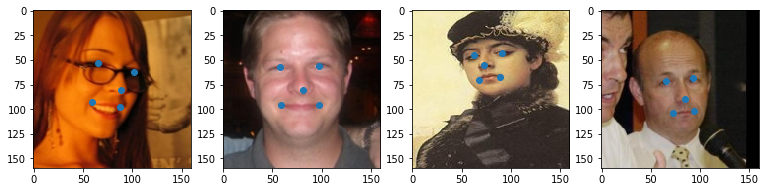

        Female                     Male                     Male                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


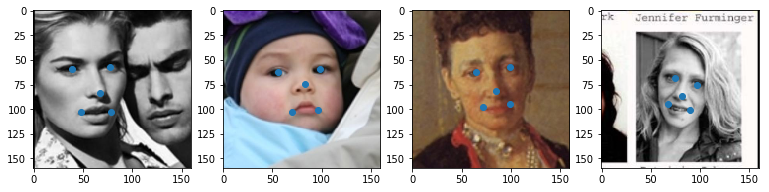

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


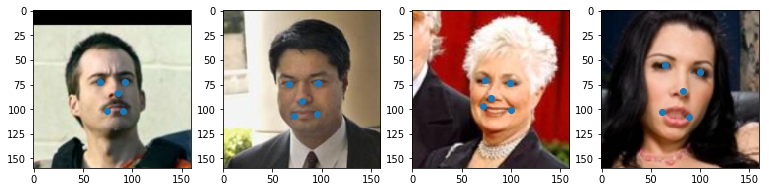

        Male                     Male                     Female                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [47]:
viz_result_train(train_pred,[1,1,1,1,1])
viz_result_train(train_pred,[1,1,1,1,1])
viz_result_train(train_pred,[1,1,1,1,1])

### Validation Performance Visualization

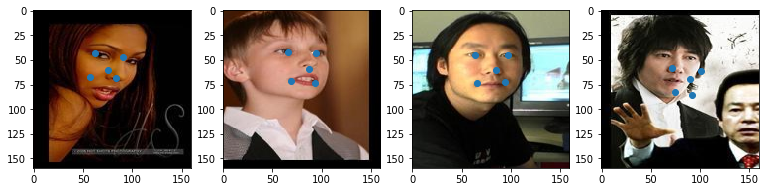

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


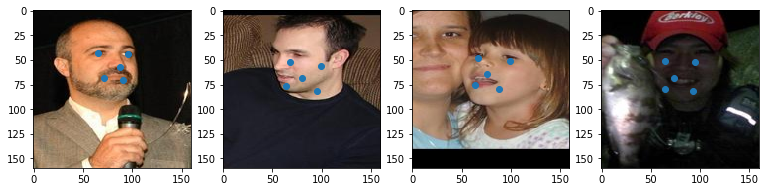

        Male                     Male                     Female                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


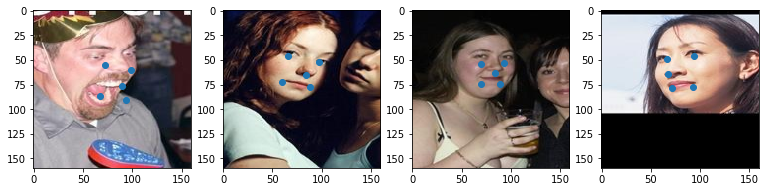

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [48]:
viz_result_val(val_pred,[1,1,1,1,1])
viz_result_val(val_pred,[1,1,1,1,1])
viz_result_val(val_pred,[1,1,1,1,1])

# Losses and Metrics Visualization

![img](https://i.imgur.com/atgnYqW.png)
![img](https://i.imgur.com/wUE3OCU.png)
![img](https://i.imgur.com/wTiF5NL.png)
![img](https://i.imgur.com/Elb6pcy.png)
![img](https://i.imgur.com/UpSKGvn.png)
![img](https://i.imgur.com/bUHRa8b.png)
![img](https://i.imgur.com/nYbPBEs.png)
![img](https://i.imgur.com/cS4parG.png)
![img](https://i.imgur.com/HWD48nD.png)
![img](https://i.imgur.com/hKUkmDx.png)

---
---
---
---


> Solving FKP + Smile + Gender + Glasses
---
---
## 3. Model on 4 tasks(FKP + Smile + Gender + Glasses) 

In [19]:
inp = Input(shape=(160,160,3))

#1st convolution pair
conv1 = Conv2D(16,kernel_size=(5,5), activation='relu')(inp)
mx1 = MaxPooling2D(pool_size=(2,2))(conv1)

#2nd convolution pair
conv2 = Conv2D(48,kernel_size=(3,3), activation='relu')(mx1)
mx2 = MaxPooling2D(pool_size=(2,2))(conv2)


#3rd convolution pair
conv3 = Conv2D(64,kernel_size=(3,3), activation='relu')(mx2)
mx3 = MaxPooling2D(pool_size=(2,2))(conv3)


#4th convolution pair
conv4 = Conv2D(64,kernel_size=(2,2), activation='relu')(mx3)

flt = Flatten()(conv4)

dense = Dense(100,activation='relu')(flt)

reg_op = Dense(10,activation='linear',name='key_point')(dense)

gndr_op = Dense(2,activation='sigmoid',name='gender')(dense)

smile_op = Dense(2,activation='sigmoid',name='smile')(dense)

glasses_op = Dense(2,activation='sigmoid',name='glasses')(dense)

model = Model(inp,[reg_op,gndr_op,smile_op,glasses_op])

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 156, 156, 16) 1216        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 78, 78, 16)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 76, 76, 48)   6960        max_pooling2d[0][0]              
______________________________________________________________________________________________

In [20]:
# These losses will be added in keras at the time of optimization
# reference : https://www.amazon.com/Deep-Learning-Python-Francois-Chollet/dp/1617294438

loss_dic = {'key_point':'mse','gender':'binary_crossentropy','smile':'binary_crossentropy', 'glasses':'binary_crossentropy' }

# since the main task is keypoint detection, hence giving more weightage to this one.
# other important task in pose estimation


loss_weights = {'key_point':2,'gender':1,'smile':4,'glasses':1}

metrics = {'key_point':'mse','gender':['binary_crossentropy','acc'],'smile':['binary_crossentropy','acc'], 'glasses':['binary_crossentropy','acc'] }

In [21]:
model.compile(optimizer='adam',loss=loss_dic,loss_weights=loss_weights,metrics=metrics)

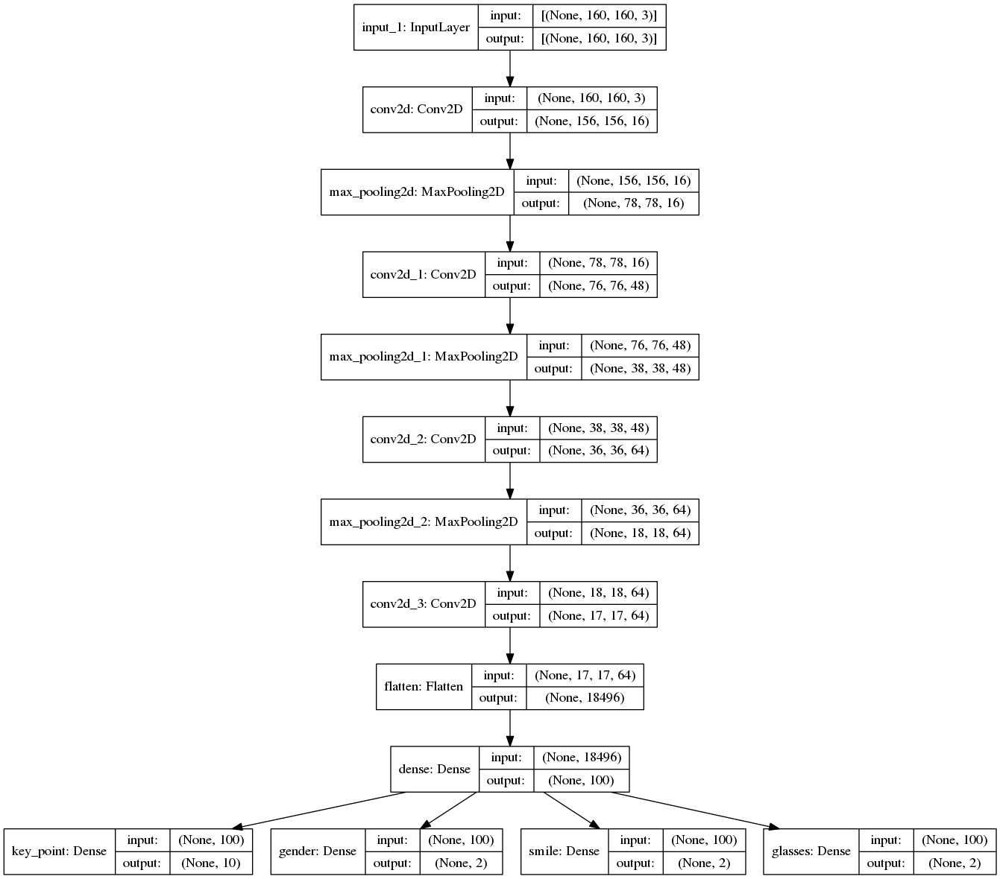

In [22]:
plot_model(model,to_file='model3.png',show_shapes=True)

In [23]:
epochs = 30
bs = 64
tsboard = TensorBoard(log_dir='logs3/{}'.format(time()), write_graph=True, write_images=True)

In [24]:
start = datetime.now()
H = model.fit(train_images, [train_keypoint_op,]+train_categorical_ops[:-1], epochs = epochs, batch_size=bs, validation_data=(val_images,[val_keypoint_op,]+val_categorical_ops[:-1]),callbacks=[TrainValTensorBoard(log_dir='./log3',write_graph=False)])

Train on 9000 samples, validate on 1000 samples
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Epoch 1/30
9000/9000 [==============================] - 120s 13ms/sample - loss: 794.8428 - key_point_loss: 387.0110 - gender_loss: 1.7345 - smile_loss: 4.1568 - glasses_loss: 1.2962 - key_point_mean_squared_error: 387.5846 - gender_binary_crossentropy: 1.7364 - gender_acc: 0.5317 - smile_binary_crossentropy: 4.1599 - smile_acc: 0.5469 - glasses_binary_crossentropy: 1.2976 - glasses_acc: 0.7886 - val_loss: 476.9710 - val_key_point_loss: 227.8457 - val_gender_loss: 1.8000 - val_smile_loss: 

Epoch 11/30
9000/9000 [==============================] - 114s 13ms/sample - loss: 45.3153 - key_point_loss: 15.0104 - gender_loss: 0.5335 - smile_loss: 3.5837 - glasses_loss: 0.4061 - key_point_mean_squared_error: 15.0213 - gender_binary_crossentropy: 0.5335 - gender_acc: 0.7261 - smile_binary_crossentropy: 3.5833 - smile_acc: 0.6711 - glasses_binary_crossentropy: 0.4062 - glasses_acc: 0.8519 - val_loss: 106.9173 - val_key_point_loss: 44.6407 - val_gender_loss: 0.7245 - val_smile_loss: 4.0909 - val_glasses_loss: 0.3784 - val_key_point_mean_squared_error: 44.6873 - val_gender_binary_crossentropy: 0.7278 - val_gender_acc: 0.5645 - val_smile_binary_crossentropy: 4.1090 - val_smile_acc: 0.5285 - val_glasses_binary_crossentropy: 0.3788 - val_glasses_acc: 0.8920
Epoch 12/30
9000/9000 [==============================] - 115s 13ms/sample - loss: 39.6443 - key_point_loss: 12.2208 - gender_loss: 0.5194 - smile_loss: 3.5730 - glasses_loss: 0.3902 - key_point_mean_squared_error: 12.2209 - gender_bi

Epoch 22/30
9000/9000 [==============================] - 115s 13ms/sample - loss: 24.9180 - key_point_loss: 5.1301 - gender_loss: 0.3797 - smile_loss: 3.4961 - glasses_loss: 0.2870 - key_point_mean_squared_error: 5.1286 - gender_binary_crossentropy: 0.3801 - gender_acc: 0.8276 - smile_binary_crossentropy: 3.4985 - smile_acc: 0.7216 - glasses_binary_crossentropy: 0.2868 - glasses_acc: 0.8845 - val_loss: 91.3178 - val_key_point_loss: 36.6102 - val_gender_loss: 0.7365 - val_smile_loss: 4.1748 - val_glasses_loss: 0.4127 - val_key_point_mean_squared_error: 36.7488 - val_gender_binary_crossentropy: 0.7377 - val_gender_acc: 0.6255 - val_smile_binary_crossentropy: 4.1671 - val_smile_acc: 0.5375 - val_glasses_binary_crossentropy: 0.4142 - val_glasses_acc: 0.8475
Epoch 23/30
9000/9000 [==============================] - 116s 13ms/sample - loss: 24.3888 - key_point_loss: 4.8878 - gender_loss: 0.3667 - smile_loss: 3.4900 - glasses_loss: 0.2717 - key_point_mean_squared_error: 4.8909 - gender_binary_

In [ ]:

%tensorboard --logdir {'logs3/'} --host localhost --port 8083

In [26]:
end = datetime.now()
print('\n\nTime taken to train the model: ',end-start)
model.save('model3.h5')
train_pred = model.predict(train_images)
val_pred = model.predict(val_images)

print('MSE on train data: ', mean_squared_error(train_keypoint_op,train_pred[0] ))
print('MSE on validation data: ', mean_squared_error(val_keypoint_op,val_pred[0] ))



Time taken to train the model:  1:01:33.358358
MSE on train data:  2.9205250961752722
MSE on validation data:  35.072992153148434


### Train Performance Visualization

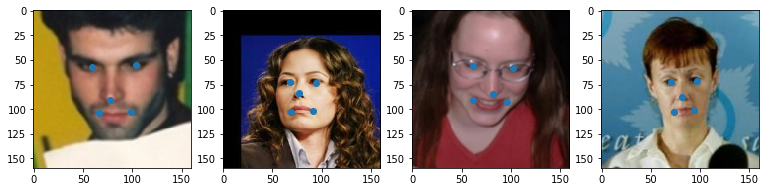

        Male                     Female                     Female                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


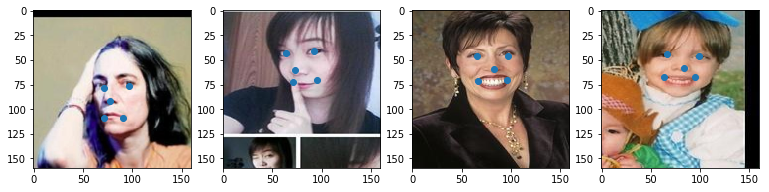

        Female                     Female                     Female                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


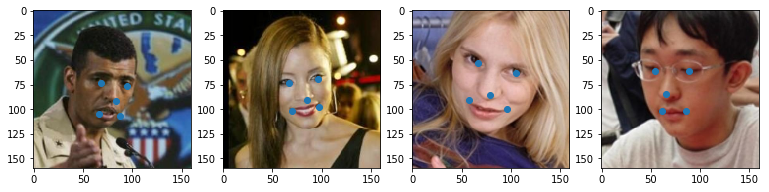

        Male                     Female                     Female                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


In [27]:
viz_result_train(train_pred,[1,1,1,1,0])
viz_result_train(train_pred,[1,1,1,1,0])
viz_result_train(train_pred,[1,1,1,1,0])

### Validation Performance Visualization

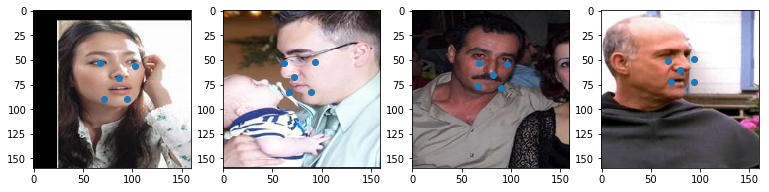

        Male                     Male                     Male                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


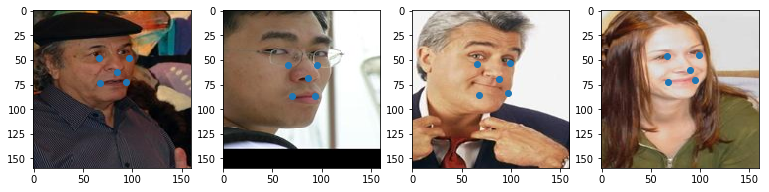

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


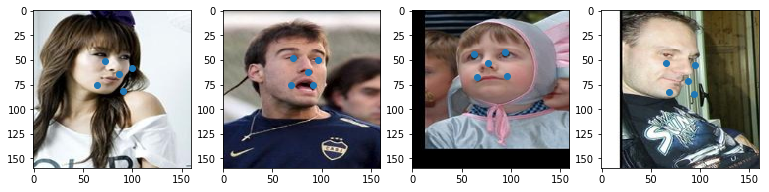

        Female                     Male                     Female                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses


In [28]:

viz_result_val(val_pred,[1,1,1,1,0])
viz_result_val(val_pred,[1,1,1,1,0])
viz_result_val(val_pred,[1,1,1,1,0])

# Losses and Metrics Visualization

![img](https://i.imgur.com/dABd5a6.png)
![img](https://i.imgur.com/7irPbed.png)
![img](https://i.imgur.com/20vBtKP.png)
![img](https://i.imgur.com/mMnvb9O.png)
![img](https://i.imgur.com/exqIIOV.png)
![img](https://i.imgur.com/A8BIZ02.png)
![img](https://i.imgur.com/UaFhxec.png)
![img](https://i.imgur.com/0gRyqUL.png)


---
---
---
---
---

> From the above 3 experiments, and as keypoints depends a lot on pose of the face, let's solve only these problem together.


## 4  Model on  keypoint + Pose estimation: Two task learning

In [19]:
inp = Input(shape=(160,160,3))

#1st convolution pair
conv1 = Conv2D(16,kernel_size=(5,5), activation='relu')(inp)
mx1 = MaxPooling2D(pool_size=(2,2))(conv1)

#2nd convolution pair
conv2 = Conv2D(48,kernel_size=(3,3), activation='relu')(mx1)
mx2 = MaxPooling2D(pool_size=(2,2))(conv2)

#3rd convolution pair
conv3 = Conv2D(64,kernel_size=(3,3), activation='relu')(mx2)
mx3 = MaxPooling2D(pool_size=(2,2))(conv3)

#4th convolution pair
conv4 = Conv2D(64,kernel_size=(2,2), activation='relu')(mx3)

flt = Flatten()(conv4)

dense = Dense(100,activation='relu')(flt)

reg_op = Dense(10,activation='linear',name='key_point')(dense)

pose_op = Dense(5,activation='softmax',name='pose')(dense)

model = Model(inp,[reg_op,pose_op])

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 156, 156, 16) 1216        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 78, 78, 16)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 76, 76, 48)   6960        max_pooling2d[0][0]              
______________________________________________________________________________________________

In [20]:
# These losses will be added in keras at the time of optimization
# reference : https://www.amazon.com/Deep-Learning-Python-Francois-Chollet/dp/1617294438

loss_dic = {'key_point':'mse','pose':'categorical_crossentropy'}

# sicnce the main task is keypoint detection, hence giving more weightage to this one.
# other important task in pose estimation


loss_weights = {'key_point':4,'pose':11}

metrics = {'key_point':'mse', 'pose':['categorical_crossentropy','acc']}

In [21]:
model.compile(optimizer='adam',loss=loss_dic,loss_weights=loss_weights,metrics=metrics)

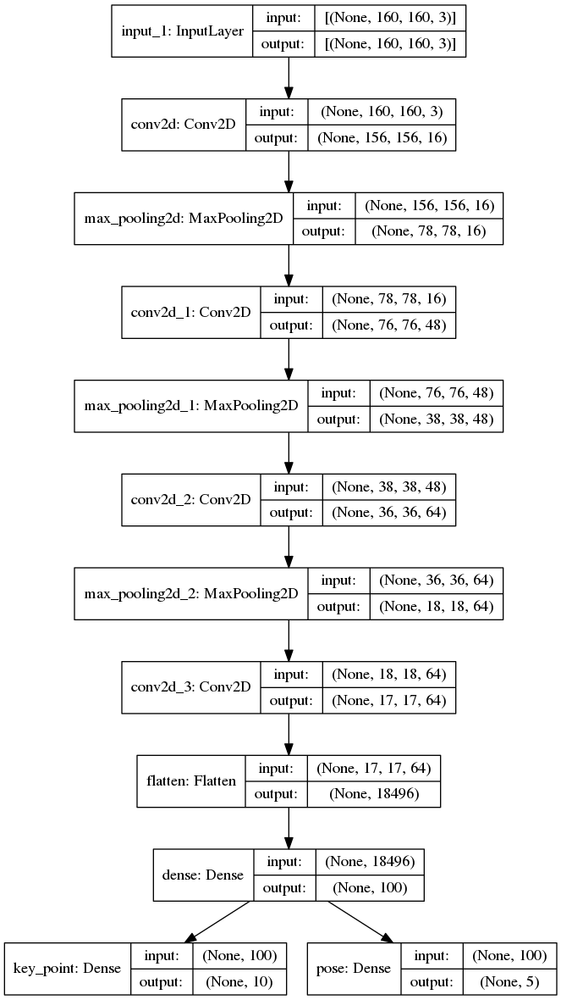

In [22]:
plot_model(model,to_file='model4.png',show_shapes=True)

In [23]:
epochs = 35
bs = 64
tsboard = TensorBoard(log_dir='logs4/{}'.format(time()), write_graph=True, write_images=True)

In [24]:
start = datetime.now()
H = model.fit(train_images, [train_keypoint_op,train_categorical_ops[-1]], epochs = epochs, batch_size=bs, validation_data=(val_images,[val_keypoint_op,val_categorical_ops[-1]]),callbacks=[TrainValTensorBoard(log_dir='./log4',write_graph=False)])

Train on 9000 samples, validate on 1000 samples
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Epoch 1/35
9000/9000 [==============================] - 141s 16ms/sample - loss: 1905.0769 - key_point_loss: 466.2006 - pose_loss: 3.4154 - key_point_mean_squared_error: 466.8843 - pose_categorical_crossentropy: 3.4126 - pose_acc: 0.7877 - val_loss: 909.6363 - val_key_point_loss: 196.1645 - val_pose_loss: 11.2040 - val_key_point_mean_squared_error: 196.4704 - val_pose_categorical_crossentropy: 11.2504 - val_pose_acc: 0.3020
Epoch 2/35
9000/9000 [==============================] - 140s 16ms/

In [ ]:

%tensorboard --logdir {'logs4/'} --host localhost --port 8087

In [26]:
end = datetime.now()
print('\n\nTime taken to train the model: ',end-start)
model.save('keypoint_pose.h5')
train_pred = model.predict(train_images)
val_pred = model.predict(val_images)

print('MSE on train data: ', mean_squared_error(train_keypoint_op,train_pred[0] ))
print('MSE on validation data: ', mean_squared_error(val_keypoint_op,val_pred[0] ))



Time taken to train the model:  1:22:12.368029
MSE on train data:  2.825882283863525
MSE on validation data:  31.41507419233826


### Train Performance Visualization

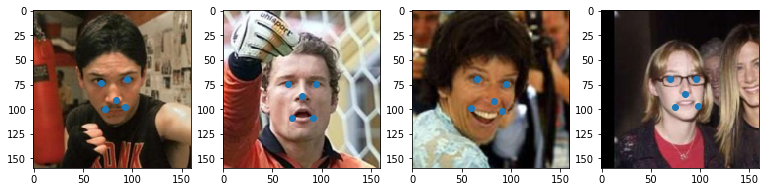

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


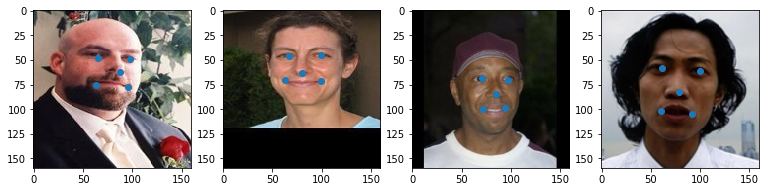

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


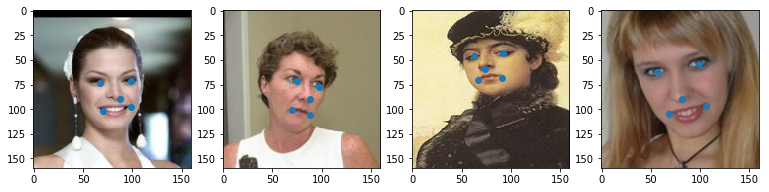

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [27]:
viz_result_train(train_pred,[1,0,0,0,1])
viz_result_train(train_pred,[1,0,0,0,1])
viz_result_train(train_pred,[1,0,0,0,1])

### Validation Performance Visualization

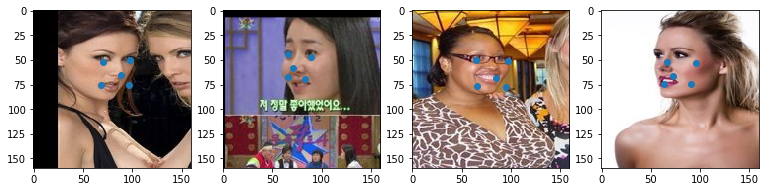

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


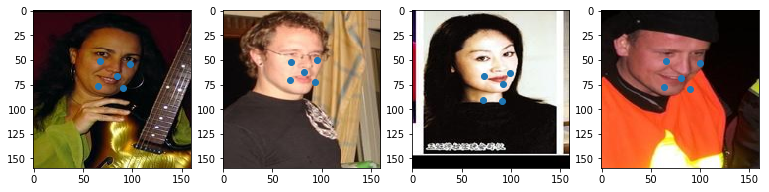

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


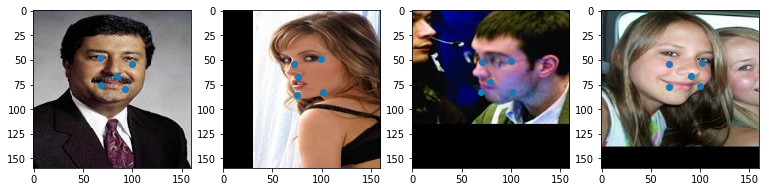

        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [28]:
viz_result_val(val_pred,[1,0,0,0,1])
viz_result_val(val_pred,[1,0,0,0,1])
viz_result_val(val_pred,[1,0,0,0,1])

# Losses and Metrics Visualization 

![img](https://i.imgur.com/56bdrdh.png)
![img](https://i.imgur.com/DSucisB.png)
![img](https://i.imgur.com/E4Cmh1E.png)
![img](https://i.imgur.com/s6ter5d.png)

---
---
---
---
---

> Let's check out whether, is there any real advantage of solving multi-task problem for facial keypoint detection or not?

**Reality check**

## 5. Model on only Main task: KeyPoint Detection

In [29]:
inp = Input(shape=(160,160,3))

#1st convolution pair
conv1 = Conv2D(16,kernel_size=(5,5), activation='relu')(inp)
mx1 = MaxPooling2D(pool_size=(2,2))(conv1)


#2nd convolution pair
conv2 = Conv2D(48,kernel_size=(3,3), activation='relu')(mx1)
mx2 = MaxPooling2D(pool_size=(2,2))(conv2)


#3rd convolution pair
conv3 = Conv2D(64,kernel_size=(3,3), activation='relu')(mx2)
mx3 = MaxPooling2D(pool_size=(2,2))(conv3)


#4th convolution pair
conv4 = Conv2D(64,kernel_size=(2,2), activation='relu')(mx3)

flt = Flatten()(conv4)

dense = Dense(100,activation='relu')(flt)

reg_op = Dense(10,activation='linear',name='key_point')(dense)


model = Model(inp,reg_op)

model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 156, 156, 16)      1216      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 78, 78, 16)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 76, 76, 48)        6960      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 38, 38, 48)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 36, 36, 64)        27712     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 18, 18, 64)        0   

In [30]:
# These losses will be added in keras at the time of optimization
# reference : https://www.amazon.com/Deep-Learning-Python-Francois-Chollet/dp/1617294438

loss_dic = {'key_point':'mse'}

metrics = {'key_point':['mse','mae']}

In [31]:
model.compile(optimizer='adam',loss=loss_dic,metrics=metrics)

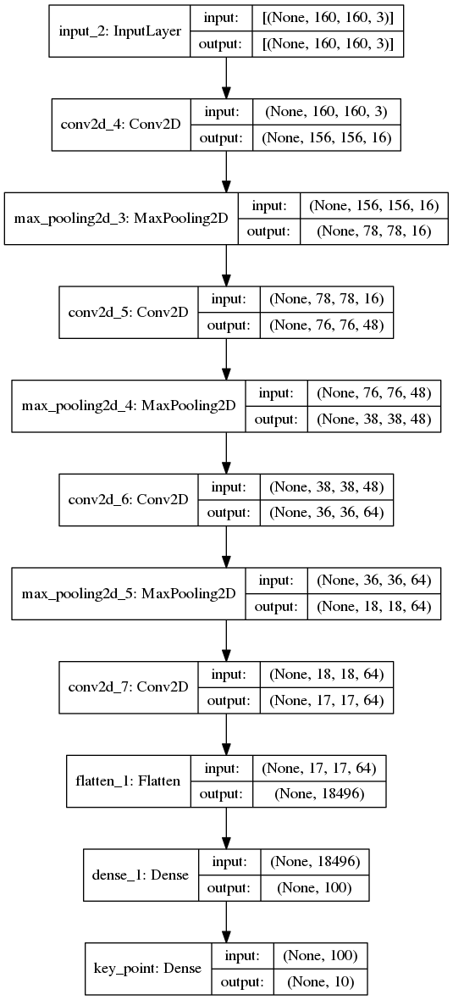

In [32]:
plot_model(model,to_file='model5.png',show_shapes=True)

In [33]:
epochs = 35
bs = 64
tsboard = TensorBoard(log_dir='logs5/{}'.format(time()), write_graph=True, write_images=True)

In [34]:
start = datetime.now()
H = model.fit(train_images, train_keypoint_op, epochs = epochs, batch_size=bs, validation_data=(val_images,val_keypoint_op),callbacks=[TrainValTensorBoard(log_dir='./log5',write_graph=False)])

Train on 9000 samples, validate on 1000 samples
Epoch 1/35
9000/9000 [==============================] - 146s 16ms/sample - loss: 353.2435 - mean_squared_error: 353.2437 - mean_absolute_error: 12.5604 - val_loss: 196.0829 - val_mean_squared_error: 196.0829 - val_mean_absolute_error: 10.9706
Epoch 2/35
9000/9000 [==============================] - 145s 16ms/sample - loss: 128.1047 - mean_squared_error: 128.1047 - mean_absolute_error: 8.6356 - val_loss: 208.5541 - val_mean_squared_error: 208.5541 - val_mean_absolute_error: 11.5289
Epoch 3/35
9000/9000 [==============================] - 146s 16ms/sample - loss: 117.2405 - mean_squared_error: 117.2405 - mean_absolute_error: 8.2823 - val_loss: 139.4486 - val_mean_squared_error: 139.4486 - val_mean_absolute_error: 9.0126
Epoch 4/35
9000/9000 [==============================] - 145s 16ms/sample - loss: 88.8023 - mean_squared_error: 88.8023 - mean_absolute_error: 7.1404 - val_loss: 124.0081 - val_mean_squared_error: 124.0081 - val_mean_absolute_e

In [ ]:

%tensorboard --logdir {'logs5/'} --host localhost --port 8085

In [36]:
end = datetime.now()
print('\n\nTime taken to train the model: ',end-start)
model.save('keypoint.h5')
train_pred = model.predict(train_images)
val_pred = model.predict(val_images)

print('MSE on train data: ', mean_squared_error(train_keypoint_op,train_pred ))
print('MSE on validation data: ', mean_squared_error(val_keypoint_op,val_pred ))



Time taken to train the model:  1:23:04.357090
MSE on train data:  2.822843715225789
MSE on validation data:  30.50257287238015


# Losses and Metrics visualization

![img](https://i.imgur.com/cZR0L0r.png)
![img](https://i.imgur.com/5L0TQIk.png)

### Train Performance Visualization

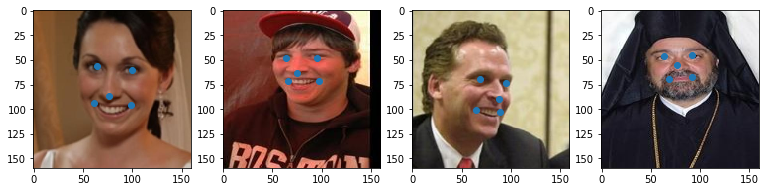

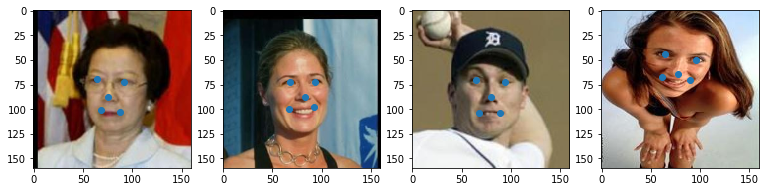

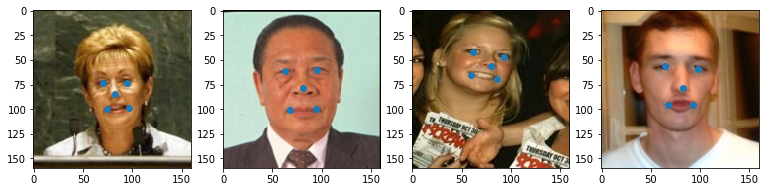

In [37]:
viz_result_train([train_pred,],[1,0,0,0,0])
viz_result_train([train_pred,],[1,0,0,0,0])
viz_result_train([train_pred,],[1,0,0,0,0])

### Validation Performance Visualization

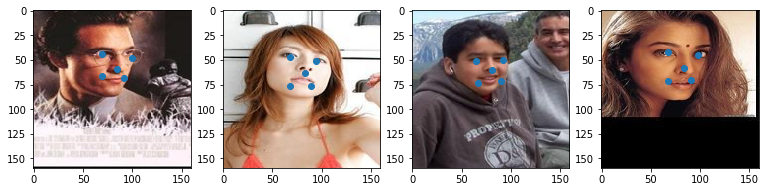

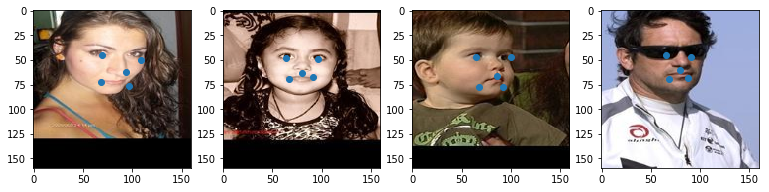

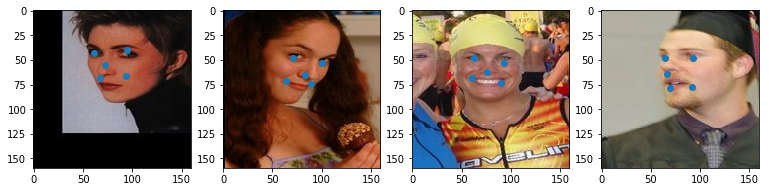

In [38]:
viz_result_val([val_pred,],[1,0,0,0,0])
viz_result_val([val_pred],[1,0,0,0,0])
viz_result_val([val_pred],[1,0,0,0,0])

---
---
---
---
---

## Test Set

In [3]:
f = open('testing.txt','r')
f2 = open('testing_new.txt','w')
for i,line in enumerate(f.readlines()):
    if i==0:
        continue
    line = line.strip()
    
    f2.write(line)
    f2.write('\n')
f2.close()
f.close()

In [55]:
test = pd.read_csv('testing_new.txt',sep=' ',header=None,names=['Path']+list('BCDEFGHIJK')+['Gender','Smile','Glasses','Pose'])

print(test.shape)

test.head()

(2994, 15)


,Path,B,C,D,E,F,G,H,I,J,K,Gender,Smile,Glasses,Pose
0,AFLW/0002-image04733.jpg,43.540835,89.421053,85.936479,56.027223,97.551724,53.704174,42.669691,77.515426,101.326679,90.872958,2,1,2,4
1,AFLW/0003-image07098.jpg,56.027223,97.551724,81.871143,52.542650,89.421053,47.315789,54.284936,75.482759,88.259528,95.519056,2,1,2,3
2,AFLW/0004-image64929.jpg,55.736842,100.455535,69.384755,65.900181,95.228675,58.931034,49.638838,76.063521,108.876588,105.101633,1,2,2,2
3,AFLW/0005-image15367.jpg,40.637024,84.194192,68.513612,43.831216,81.000000,54.865699,53.413793,86.226860,104.230490,100.745917,2,1,2,3
4,AFLW/0006-image21655.jpg,52.542650,96.680581,81.580762,47.025408,85.936479,38.604356,47.896552,79.838475,92.615245,99.584392,2,1,2,4


In [56]:
#utility function to load and resize all of the images uniformly for network input
def image(im_path):
    '''
    
    This function takes the path of original image as input, read the image,
    convert the color schema from BGR to RGB and then resize it to (160,160,3).
    
    Parameter: Path of image
    Return: Image with shape (160,160,3)
    
    '''
    img =  cv2.imread(im_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (160,160), cv2.INTER_AREA) #(w,h) #(#cols,#rows)
    return img

In [57]:
#utility function to calculate the newly w_h ratio after resizing the image so that keypoints can be transformed accordingly
def w_h_ratio(im_path):
    '''
    This function takes the path of original image as input, calculate the original dims of image
    and then calculates the width and heigh ratio by dividing new dim by original dim.
    
    Parameter: Image path
    Returns: Ratio of new width/height to original one
    
    '''
    img =  cv2.imread(im_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    (h, w) = img.shape[:2]
    r_w = 160 / float(w)
    r_h = 160/ (float(h))
    return [r_w,r_h]

In [58]:
ohes = pickle.load(open('ohes.pkl','rb'))
gender_map = {1:'Male',2:'Female'}
smile_map = {1:'Smile',2:'Not Smile'}
glasses_map = {1:'With Glasses',2:'No Glasses'}
pose_map = {1: '-60',2:'-30',3:'0',4:'+30',5:'+60'}

In [59]:
# loading, resizing and then storing all of the images in a numpy array
test_images = []

for row in tqdm(test.iterrows()):
    img = image(row[1]['Path'])
    test_images.append(img)
    
test_images = np.array(test_images)
print(test_images.shape)

2994it [00:02, 1065.75it/s]


(2994, 160, 160, 3)


In [60]:
# calculating the ratio of new_shape/old_shape
test[['r_w','r_h']] = test.apply(lambda x: w_h_ratio(x['Path']),axis=1,result_type='expand')

In [61]:
# changing the (x,y) co-ordinates with new ones after resizing
for x in list('BCDEF'):
    test[x] = test[x]*test['r_w'] #x_co-ordinate
for y in list('GHIJK'):
    test[y] = test[y]*test['r_h'] #y_co-ordinate
    
test.drop(['r_w','r_h'],axis=1,inplace=True)

In [62]:
model = load_model('all_lossses_weighst2.h5')
test_pred = model.predict(test_images)

In [64]:
mse = mean_squared_error(test[list('BCDEFGHIJK')].values,test_pred[0])
print('Test MSE: ',mse)

Test MSE: 61.14104678588645


# Visualization

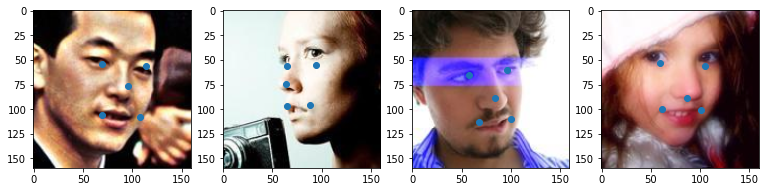

        Male                     Male                     Male                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


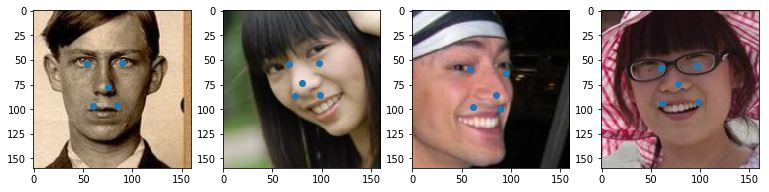

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


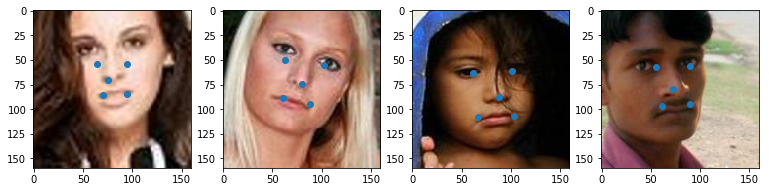

        Male                     Female                     Male                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [66]:
viz_result_test(test_pred,[1,1,1,1,1])
viz_result_test(test_pred,[1,1,1,1,1])
viz_result_test(test_pred,[1,1,1,1,1])

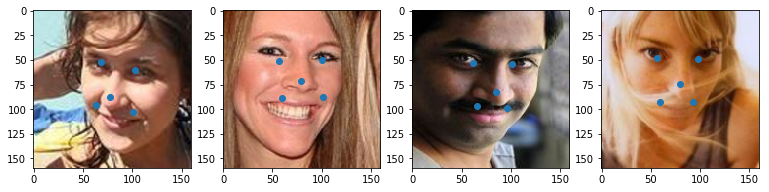

        Male                     Female                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


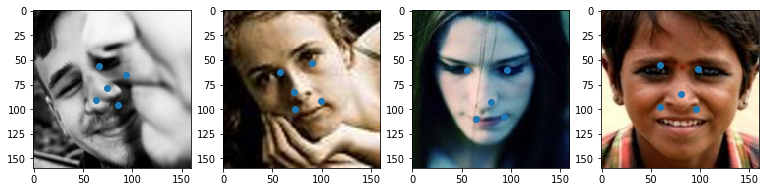

        Male                     Male                     Male                     Female
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


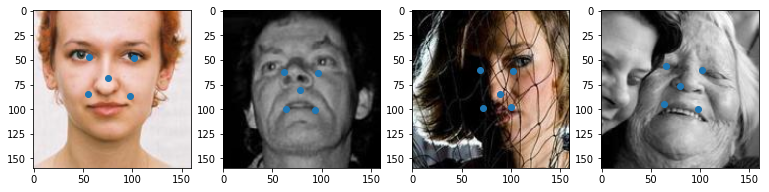

        Female                     Male                     Male                     Male
        Smile                    Smile                    Smile                    Smile
        No Glasses               No Glasses               No Glasses               No Glasses
        Pose: 0                 Pose: 0                 Pose: 0                 Pose: 0


In [72]:
viz_result_test(test_pred,[1,1,1,1,1])
viz_result_test(test_pred,[1,1,1,1,1])
viz_result_test(test_pred,[1,1,1,1,1])

# Learnings

- The main thing noticed by the authors of the paper was absolutely correct i.e. posing this problem as multi-task learning problem.

- We've able to achieve quite good result even on this challenging problem with occulusion, pose  and different problems.

- Key thing to learn: Deep learning is more than black-box. Nothing beats the human intuition and problem solving skill.

- Better approaches [Thinking from first principle] >>> Running complex model.

- Solve multiple tasks if and only if the main task is being dependent on other auxiliary tasks.

---
---